In [ ]:
# importowane biblioteki
import os
from google.colab import drive
drive._mount('/content/drive')
import glob
import cv2 as cv
from google.colab.patches import cv2_imshow
import shutil
import matplotlib.pyplot as plt
import random
import numpy as np

Mounted at /content/drive


In [ ]:
import pandas as pd
import seaborn as sns
from matplotlib.colors import LogNorm

In [ ]:
# !pip3 install imagesize 
import imagesize

In [ ]:
# odpakowanie obrazów - zbiór treningowy
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Train/raw/images/part1.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Train/images'
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Train/raw/images/part2.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Train/images'
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Train/raw/images/part3.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Train/images'
# i adnotacji
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Train/raw/DOTA-v1.5_train_hbb.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Train/annots'

In [ ]:
# odpakowanie obrazów - zbiór walidacyjny (wykorzystany później jako zbiór testowy) 
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Val/raw/images/part1.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Val/images/'
# i adnotacji
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Val/raw/DOTA-v1.5_val_hbb.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Val/annots'

In [ ]:
# odpakowanie obrazów - zbiór testowy
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Test/raw/part1.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Test/images'
# !unzip '/content/drive/MyDrive/DOTA/Dataset/Test/raw/part2.zip' -d '/content/drive/MyDrive/DOTA/Dataset/Test/images'

In [ ]:
# ścieżki do folderów z danymi
folder_with_data = '/content/drive/MyDrive/DOTA/Dataset'

train_images_dir = folder_with_data + '/Train/' + 'images'
train_annotations_dir = folder_with_data + '/Train/' + 'annots'

val_images_dir = folder_with_data + '/Val/' + 'images'
val_annotations_dir = folder_with_data + '/Val/' + 'annots'

In [ ]:
# stworzenie list X - dane (obrazy) y - adnotacje (indeksy sobie odpowiadające)
def create_dataset(all_images_folder, all_annots_folder):
  X = []
  y = []
  all_images = glob.glob(all_images_folder + '/*.png')
  all_annots = glob.glob(all_annots_folder + '/*.txt')
  print(len(all_images), len(all_annots))
  
  for annot in all_annots:
    annot_file_name = os.path.basename(annot).replace('.txt', '')
    for image in all_images:
      image_file_name = os.path.basename(image).replace('.png', '')
      if annot_file_name == image_file_name:
        X.append(image)
        y.append(annot)
        break
  return X, y

In [ ]:
# nieprzetworzone obrazy i adnotacje, orginalny zbiór treningowy jest dzielony na zbiór treningowy i
# walidacyjny, a orginalny zbiór walidacyjny wykorzystywany jest jako zbiór testowy
X_train, y_train = create_dataset(train_images_dir, train_annotations_dir)
print(len(X_train), len(y_train))
print(X_train)
print(y_train)
X_test, y_test = create_dataset(val_images_dir, val_annotations_dir)
print(len(X_test), len(y_test))
print(X_test)
print(y_test)

1411 1411
1411 1411
['/content/drive/MyDrive/DOTA/Dataset/Train/images/P0831.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0746.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0778.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0762.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0782.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0750.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0786.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0846.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0743.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0861.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0825.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0843.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0792.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0805.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0804.png', '/content/drive/MyDrive/DOTA/Dataset/Train/images

In [ ]:
# odczyt i zwrócenie wymiarów obrazów z danego zbioru danych
def return_h_w(data):
  hs = []
  ws = []
  for image in data:
    w, h = imagesize.get(image)
    hs.append(h)
    ws.append(w)
  return hs, ws

In [ ]:
heights_train_val, widths_train_val = return_h_w(X_train)
heights_test, widths_test = return_h_w(X_test)

In [ ]:
# zwraca słownik ilości wartości zawartch w przedziałach określonych przez parametr step
def return_amount_of_values(list_of_values, step=100):
  amount_of_values = {}
  max_val = max(list_of_values)
  for key in range(0, (max_val // step) + 1):
    amount_of_values[key] = 0
  for value in list_of_values:
    amount_of_values[value // step] += 1
  
  range_amount_of_values = {}
  for key, value in zip(amount_of_values.keys(), amount_of_values.values()):
    range_amount_of_values[f'[{key * step}, {key * step + step - 1})'] = value
  
  return range_amount_of_values

In [ ]:
def show_histogram_dictionary(x_ax, y_ax, xlabel_, ylabel_, title_, scale, log=False):
  plt.bar(x_ax, y_ax, color='#85C1E9', log=log)
  plt.title(title_)
  plt.xlabel(xlabel_)
  plt.ylabel(ylabel_)
  plt.rcParams["figure.figsize"] = scale
  plt.xticks(rotation=90)
  plt.show()

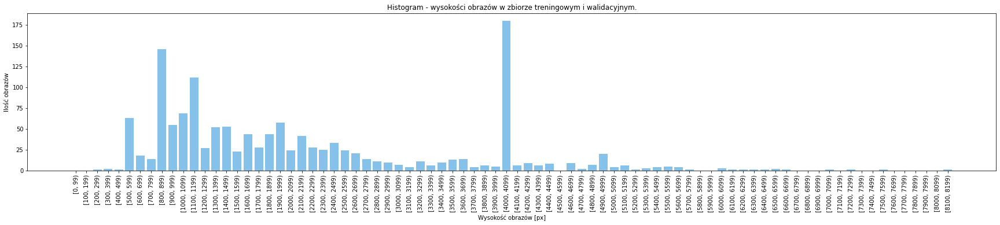

In [ ]:
heights_train_val_amount = return_amount_of_values(heights_train_val)
widths_train_val_amount = return_amount_of_values(widths_train_val)
show_histogram_dictionary(heights_train_val_amount.keys(), heights_train_val_amount.values(), 'Wysokość obrazów [px]', 'Ilość obrazów', 'Histogram - wysokości obrazów w zbiorze treningowym i walidacyjnym.', (30, 5))

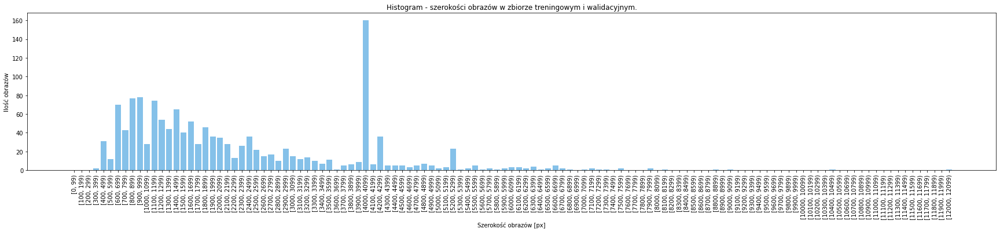

In [ ]:
show_histogram_dictionary(widths_train_val_amount.keys(), widths_train_val_amount.values(), 'Szerokość obrazów [px]', 'Ilość obrazów', 'Histogram - szerokości obrazów w zbiorze treningowym i walidacyjnym.', (30, 5))

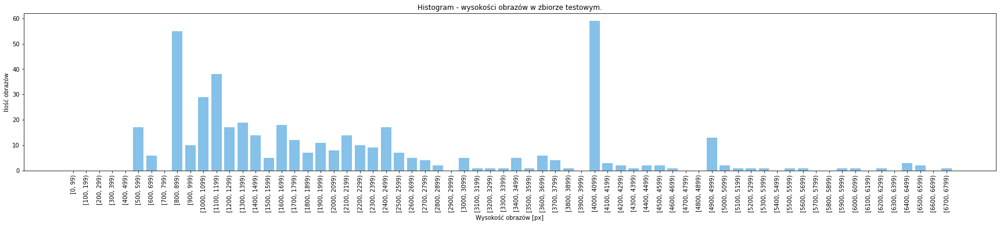

In [ ]:
heights_test_amount = return_amount_of_values(heights_test)
widths_test_amount = return_amount_of_values(widths_test)
show_histogram_dictionary(heights_test_amount.keys(), heights_test_amount.values(), 'Wysokość obrazów [px]', 'Ilość obrazów', 'Histogram - wysokości obrazów w zbiorze testowym.', (30, 5))

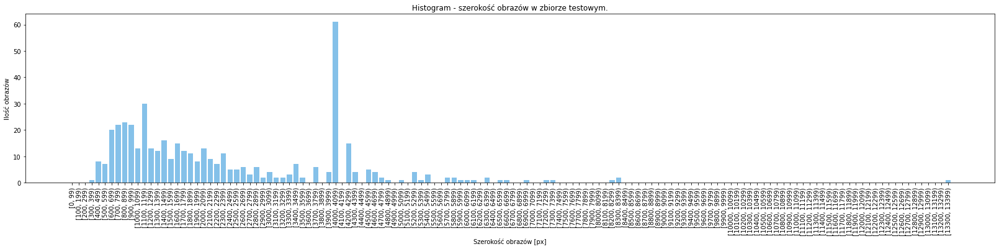

In [ ]:
show_histogram_dictionary(widths_test_amount.keys(), widths_test_amount.values(), 'Szerokość obrazów [px]', 'Ilość obrazów', 'Histogram - szerokość obrazów w zbiorze testowym.', (30, 5))

In [ ]:
def return_number_of_instances(annots):
  amount_of_classes = {
    'plane': 0,
    'ship': 0,
    'storage-tank': 0,
    'baseball-diamond': 0,
    'tennis-court': 0,
    'basketball-court': 0,
    'ground-track-field': 0,
    'harbor': 0,
    'bridge': 0,
    'large-vehicle': 0,
    'small-vehicle': 0,
    'helicopter': 0,
    'roundabout': 0,
    'soccer-ball-field': 0,
    'swimming-pool': 0,
    'container-crane': 0
  }
  amount_of_instances_on_imgs = []

  for annot in annots:
    all_lines = open(annot, 'r').readlines()
    all_lines = [line.replace('\n', '').split(' ') for line in all_lines]
    amount_of_instances_on_imgs.append(len(all_lines))
    
    if len(all_lines) > 0:
      for line in all_lines[2:]:
        amount_of_classes[line[8]] += 1
  
  return amount_of_instances_on_imgs, amount_of_classes

In [ ]:
dictionary_eng_pol = {
    'plane': 'samolot',
    'ship': 'statek',
    'storage-tank': 'zbiornik',
    'baseball-diamond': 'boisko do bejsbola',
    'tennis-court': 'kort tenisowy',
    'basketball-court': 'boisko do koszykówki',
    'ground-track-field': 'bieżnia',
    'harbor': 'port',
    'bridge': 'most',
    'large-vehicle': 'duży pojazd',
    'small-vehicle': 'mały pojazd',
    'helicopter': 'helikopter',
    'roundabout': 'rondo',
    'soccer-ball-field': 'boisko do piłki nożnej',
    'swimming-pool': 'basen',
    'container-crane': 'suwnica bramowa'
  }

In [ ]:
amount_of_instances_on_imgs_train_val, amount_of_classes_train_val = return_number_of_instances(y_train)
amount_of_instances_on_imgs_test, amount_of_classes_test = return_number_of_instances(y_test)

In [ ]:
amount_of_classes_train_val_pol = {}
amount_of_classes_test_pol = {}

for k, v in zip(amount_of_classes_train_val.keys(), amount_of_classes_train_val.values()):
  amount_of_classes_train_val_pol[dictionary_eng_pol[k]] = v

for k, v in zip(amount_of_classes_test.keys(), amount_of_classes_test.values()):
  amount_of_classes_test_pol[dictionary_eng_pol[k]] = v

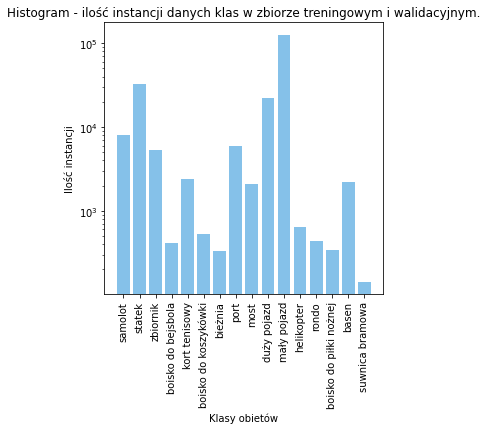

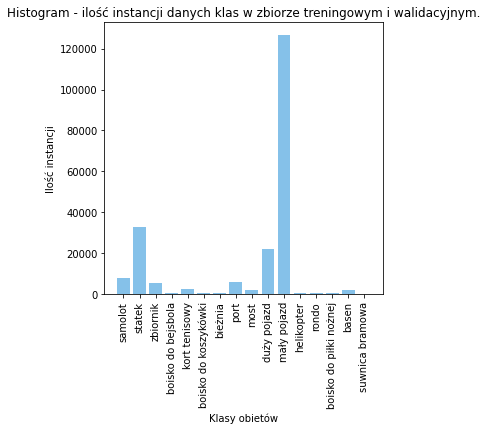

In [ ]:
show_histogram_dictionary(amount_of_classes_train_val_pol.keys(), amount_of_classes_train_val_pol.values(), 'Klasy obietów', 'Ilość instancji', 'Histogram - ilość instancji danych klas w zbiorze treningowym i walidacyjnym.', log=True, scale=(5, 5))
show_histogram_dictionary(amount_of_classes_train_val_pol.keys(), amount_of_classes_train_val_pol.values(), 'Klasy obietów', 'Ilość instancji', 'Histogram - ilość instancji danych klas w zbiorze treningowym i walidacyjnym.', log=False, scale=(5, 5))

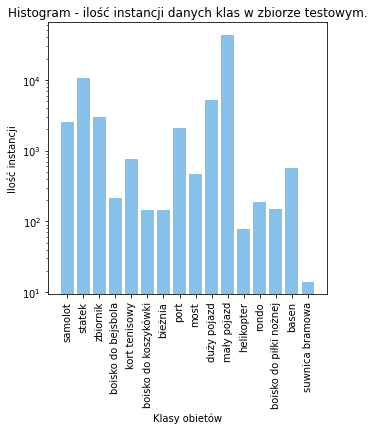

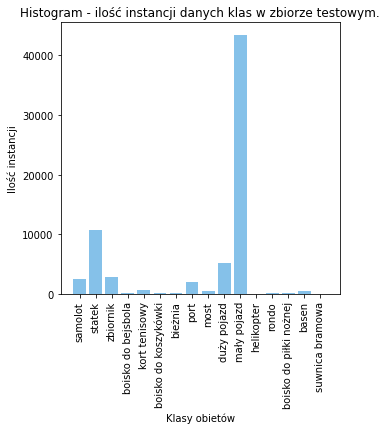

In [ ]:
show_histogram_dictionary(amount_of_classes_test_pol.keys(), amount_of_classes_test_pol.values(), 'Klasy obietów', 'Ilość instancji', 'Histogram - ilość instancji danych klas w zbiorze testowym.', log=True, scale=(5, 5))
show_histogram_dictionary(amount_of_classes_test_pol.keys(), amount_of_classes_test_pol.values(), 'Klasy obietów', 'Ilość instancji', 'Histogram - ilość instancji danych klas w zbiorze testowym.', log=False, scale=(5, 5))

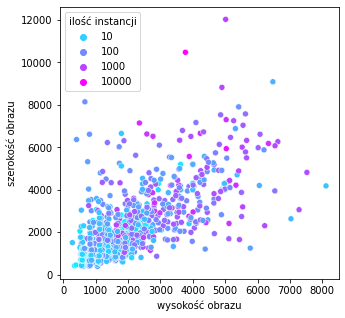

In [ ]:
train_dict = {'wysokość obrazu': heights_train_val, 'szerokość obrazu': widths_train_val, 'ilość instancji': amount_of_instances_on_imgs_train_val}

df_train = pd.DataFrame(train_dict)
sns.scatterplot(data=df_train, 
                x="wysokość obrazu", 
                y="szerokość obrazu",  
                hue='ilość instancji', 
                hue_norm=LogNorm(),
                palette='cool'
                )

# show the graph
plt.show()

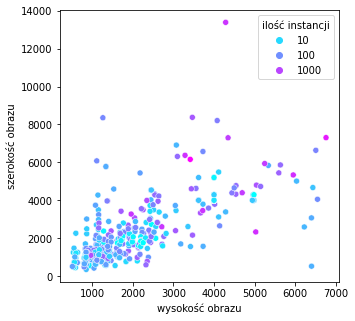

In [ ]:
test_dict = {'wysokość obrazu': heights_test, 'szerokość obrazu': widths_test, 'ilość instancji': amount_of_instances_on_imgs_test}

df_test = pd.DataFrame(test_dict)
sns.scatterplot(data=df_test, 
                x="wysokość obrazu", 
                y="szerokość obrazu",  
                hue='ilość instancji', 
                hue_norm=LogNorm(),
                palette='cool'
                )

# show the graph
plt.show()

In [ ]:
# odczyt źródła obrazów
def image_sources(annots):
  JL = 0
  GF = 0
  GEarth = 0
  for annot in annots:
    source = open(annot, 'r').readlines()[0].replace('\n', '')
    if source == 'imagesource:JL':
      JL += 1
    elif source == 'imagesource:GF':
      GF += 1
    elif source == 'imagesource:GoogleEarth':
      GEarth += 1
    else:
      print('inne źródło danych:', source)
  return JL, GF, GEarth

In [ ]:
JL_train_val, GF_train_val, GEarth_train_val = image_sources(y_train)
JL_test, GF_test, GEarth_test = image_sources(y_test)

In [ ]:
# źródło danych: https://medium.com/@kvnamipara/a-better-visualisation-of-pie-charts-by-matplotlib-935b7667d77f
# https://stackoverflow.com/questions/19852215/how-to-add-a-legend-to-matplotlib-pie-chart
# wykres kołowy
def show_pie_chart(JL_amount, GF_amount, GEarth_amount, title_):
  all_images = GF_amount + JL_amount + GEarth_amount
  labels = ['satelita JL-1', 'satelita GF-2', 'GoogleEarth']
  colors = ['#82E0AA','#F0B27A', '#85C1E9']
  sizes = [(JL_amount / all_images) * 100, 
           (GF_amount / all_images) * 100,
           (GEarth_amount / all_images) * 100]
  plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=0)
  plt.legend(labels, loc="best")
  plt.title(title_)
  plt.show()

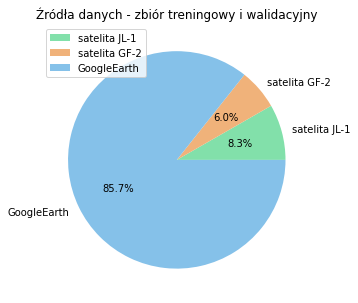

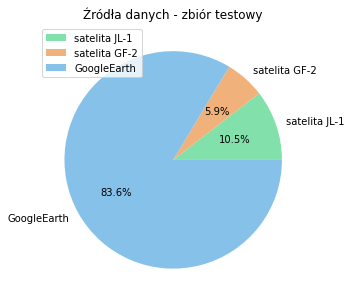

In [ ]:
show_pie_chart(JL_train_val, GF_train_val, GEarth_train_val, 'Źródła danych - zbiór treningowy i walidacyjny')
show_pie_chart(JL_test, GF_test, GEarth_test, 'Źródła danych - zbiór testowy')

In [ ]:
# normalizacja położenia pikseli do danego przedziału
def move_pixel_if_out_of_range(x, y, h, w):
  if x > w:
    x = w
  elif x < 0:
    x = 0
  if y > h:
    y = h
  elif y < 0:
    y = 0
  return x, y

In [ ]:
# sprawdzenie, czy dany piksel znajduje się w podanym przedziale
def pixel_in_range(x, y, h, w):
  if 0 <= x <= w and 0 <= y <= h:
    return True
  else:
    return False

In [ ]:
# algorym do przycinania obrazów.
# obrazy o min. powierzchni ((crop_image_size + padding)**2)
# rozbijane są na mniejsze o powierzchni crop_image_size x crop_image_size px
# ewentualny padding przy środkowych iteracjach ma na celu zmneijszenie ilości 
# obiektów przyciętych

def crop_images(X, y, crop_image_size=400, padding=100, number_of_dirs=14):
  image_number = 0
  for dir_num in range(0, number_of_dirs):
      os.mkdir(f"{new_data}/images{str(dir_num)}") 
      os.mkdir(f"{new_data}/annots{str(dir_num)}")
  
  for image_name_fullpath, annot_name_fullpath in zip(X, y):
    image = cv.imread(image_name_fullpath)
    all_lines = open(annot_name_fullpath).readlines()
    image_number += 1
    print('obraz numer:', image_number)
    
    image_name = os.path.basename(image_name_fullpath)
    annot_name = os.path.basename(annot_name_fullpath)
    boxes = []

    # bounding boxy zaczynają się od 2 linijki w adnotacjach
    for line in all_lines[2:]:
      line = line.replace('\n', '')
      assert len(line.split(' ')) == 10
      x1, y1, x2, y2, x3, y3, x4, y4, class_name, diff = line.split(' ')
      boxes.append((float(x1), float(y1), float(x2), float(y2), float(x3), 
                    float(y3), float(x4), float(y4), class_name, diff))
    
    h, w, c = image.shape
    if h >= crop_image_size + 200 or w >= crop_image_size + 200:
      h_unit = h // crop_image_size
      w_unit = w // crop_image_size
      print(h, w)
      print(h_unit, w_unit)

      l = 0
      for i in range(0, w_unit + 1):
        if w_unit != 0:
          w_temp_start = crop_image_size * i
          if i != 0 and w_temp_start - padding > 0:
            w_temp_start -= padding

          if i != w_unit:
            w_temp_stop = crop_image_size * (i + 1)
            if w_temp_stop + padding < w:
              w_temp_stop += padding
          else:
            if w - crop_image_size - padding > 0:
              w_temp_start = w - crop_image_size - padding
            else:
              w_temp_start = w - crop_image_size
            w_temp_stop = w
        elif w_unit == 0:
          w_temp_start = 0
          w_temp_stop = w
        
        for j in range(0, h_unit + 1):
          if h_unit != 0:
            h_temp_start = crop_image_size * j
            if j != 0 and h_temp_start - padding > 0:
              h_temp_start -= padding
            
            if j != h_unit:
              h_temp_stop = crop_image_size * (j + 1)
              if h_temp_stop + padding < h:
                h_temp_stop += padding
            else:
              if h - crop_image_size - padding > 0:
                h_temp_start = h - crop_image_size - padding
              else:
                h_temp_start = h - crop_image_size
              h_temp_stop = h
          elif h_unit == 0:
            h_temp_start = 0
            h_temp_stop = h
          
          print(h_temp_start, h_temp_stop, w_temp_start, w_temp_stop)
          
          cropped_image_width = w_temp_stop - w_temp_start
          cropped_image_height = h_temp_stop - h_temp_start
          line_to_write = ''
          was_one_annot = False

          for box in boxes:
            was_pixel_in_range = 0

            x1, y1, x2, y2, x3, y3, x4, y4, class_name, diff = box
            
            xs = [x1, x2, x3, x4]
            ys = [y1, y2, y3, y4]
            assert xs.count(max(xs)) == xs.count(min(xs)) == 2 and ys.count(max(ys)) == ys.count(min(ys)) == 2
            surface_org = (max(xs) - min(xs)) * (max(ys) - min(ys))

            x1_n = x1 - w_temp_start
            y1_n = y1 - h_temp_start
            if pixel_in_range(x1_n, y1_n, cropped_image_height, cropped_image_width):
              was_pixel_in_range += 1
            else:
              x1_n, y1_n = move_pixel_if_out_of_range(x1_n, y1_n, cropped_image_height, cropped_image_width)

            x2_n = x2 - w_temp_start
            y2_n = y2 - h_temp_start
            if pixel_in_range(x2_n, y2_n, cropped_image_height, cropped_image_width):
              was_pixel_in_range += 1
            else:
              x2_n, y2_n = move_pixel_if_out_of_range(x2_n, y2_n, cropped_image_height, cropped_image_width)
          
            x3_n = x3 - w_temp_start
            y3_n = y3 - h_temp_start
            if pixel_in_range(x3_n, y3_n, cropped_image_height, cropped_image_width):
              was_pixel_in_range += 1
            else:  
              x3_n, y3_n = move_pixel_if_out_of_range(x3_n, y3_n, cropped_image_height, cropped_image_width)

            x4_n = x4 - w_temp_start
            y4_n = y4 - h_temp_start
            if pixel_in_range(x4_n, y4_n, cropped_image_height, cropped_image_width):
              was_pixel_in_range += 1
            else:
              x4_n, y4_n = move_pixel_if_out_of_range(x4_n, y4_n, cropped_image_height, cropped_image_width)
            
            xs_n = [x1_n, x2_n, x3_n, x4_n]
            ys_n = [y1_n, y2_n, y3_n, y4_n]
            assert xs_n.count(max(xs_n)) == xs_n.count(min(xs_n)) and ys_n.count(max(ys_n)) == ys_n.count(min(ys_n))
            surface_new = (max(xs_n) - min(xs_n)) * (max(ys_n) - min(ys_n))
            
            if surface_new / surface_org >= 0.3 and was_pixel_in_range >= 1:
              line_to_write += f'{class_name} {int(min(xs_n))} {int(min(ys_n))} {int(max(xs_n))} {int(max(ys_n))}\n'
              was_one_annot = True
          
          if was_one_annot is True or (was_one_annot is False and random.randint(0, 70) == 10):
            dir_number = random.randint(0, number_of_dirs - 1) 
            cv.imwrite(f"{new_data}/images{dir_number}/{image_name.replace('.png', '')}_{l}.png", image[h_temp_start:h_temp_stop, w_temp_start:w_temp_stop])
            new_annot = open(f"{new_data}/annots{dir_number}/{annot_name.replace('.txt', '')}_{l}.txt", 'w')
            n = new_annot.write(line_to_write)
            new_annot.close()
            l+=1

    else:      
      print('Obraz i adnotacje bez zmian.')
      line_to_write = ''
      for box in boxes:
        x1, y1, x2, y2, x3, y3, x4, y4, class_name, diff = box
        xs_n = [x1, x2, x3, x4]
        ys_n = [y1, y2, y3, y4]
        line_to_write += f'{class_name} {int(min(xs_n))} {int(min(ys_n))} {int(max(xs_n))} {int(max(ys_n))}\n'
      
      dir_number = random.randint(0, number_of_dirs - 1)
      new_annot = open(f"{new_data}/annots{dir_number}/{annot_name}", 'w')
      n = new_annot.write(line_to_write)
      new_annot.close()
      shutil.copy(f"{image_name_fullpath}", f"{new_data}/images{dir_number}/{image_name}")

In [ ]:
# nowy folder z danymi - Train
new_data = '/content/drive/MyDrive/DOTA/Dataset/Train/mod'

In [ ]:
crop_images(X_train, y_train)

In [ ]:
# nowy folder z danymi - Val
new_data = '/content/drive/MyDrive/DOTA/Dataset/Val/mod'

In [ ]:
crop_images(X_test, y_test, number_of_dirs=6)

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
654 1154 300 900
0 500 620 1120
300 900 620 1120
654 1154 620 1120
obraz numer: 359
2064 2882
5 7
0 500 0 500
300 900 0 500
700 1300 0 500
1100 1700 0 500
1500 2000 0 500
1564 2064 0 500
0 500 300 900
300 900 300 900
700 1300 300 900
1100 1700 300 900
1500 2000 300 900
1564 2064 300 900
0 500 700 1300
300 900 700 1300
700 1300 700 1300
1100 1700 700 1300
1500 2000 700 1300
1564 2064 700 1300
0 500 1100 1700
300 900 1100 1700
700 1300 1100 1700
1100 1700 1100 1700
1500 2000 1100 1700
1564 2064 1100 1700
0 500 1500 2100
300 900 1500 2100
700 1300 1500 2100
1100 1700 1500 2100
1500 2000 1500 2100
1564 2064 1500 2100
0 500 1900 2500
300 900 1900 2500
700 1300 1900 2500
1100 1700 1900 2500
1500 2000 1900 2500
1564 2064 1900 2500
0 500 2300 2800
300 900 2300 2800
700 1300 2300 2800
1100 1700 2300 2800
1500 2000 2300 2800
1564 2064 2300 2800
0 500 2382 2882
300 900 2382 2882
700 1300 2382 2882
1100 1700 2382 2882
1500 2000 2382 

In [ ]:
# skalowanie obrazow
def img_scale(img, scale):
    # pobranie wymiarow, ich modyfikacja
    h = int(img.shape[0] * scale)
    w = int(img.shape[1] * scale)
    dim = (w, h)
    # zwrocenie przeskalowanego obrazu interpolowanego okreslona metoda
    return cv.resize(img, dim, interpolation=cv.INTER_LANCZOS4)

In [ ]:
all_colors = [(255,0,0), (255,165,0), (255,255,0), (0,255,0), (0,0,255), (75,0,130), (238,130,238), (0,0,0), (127,127,127), (255,255,255)]

In [ ]:
def crop_images_display(X, crop_image_size=400, padding=100, threshold=10):
  image_number = 0
  color = 0

  for image_name_fullpath in X:
    image = cv.imread(image_name_fullpath)
    image_number += 1
    
    image_name = os.path.basename(image_name_fullpath)
    
    h, w, c = image.shape
    if h >= crop_image_size + 200 or w >= crop_image_size + 200:
      h_unit = h // crop_image_size
      w_unit = w // crop_image_size

      if h_unit >= threshold and w_unit >= threshold:
        
        w_counter = 0
        for i in range(0, w_unit + 1):
          if w_unit != 0:
            w_temp_start = crop_image_size * i
            if i != 0 and w_temp_start - padding > 0:
              w_temp_start -= padding

            if i != w_unit:
              w_temp_stop = crop_image_size * (i + 1)
              if w_temp_stop + padding < w:
                w_temp_stop += padding
            else:
              if w - crop_image_size - padding > 0:
                w_temp_start = w - crop_image_size - padding
              else:
                w_temp_start = w - crop_image_size
              w_temp_stop = w
          elif w_unit == 0:
            w_temp_start = 0
            w_temp_stop = w
          
          h_counter = 0
          for j in range(0, h_unit + 1):
            if h_unit != 0:
              h_temp_start = crop_image_size * j
              if j != 0 and h_temp_start - padding > 0:
                h_temp_start -= padding
              
              if j != h_unit:
                h_temp_stop = crop_image_size * (j + 1)
                if h_temp_stop + padding < h:
                  h_temp_stop += padding
              else:
                if h - crop_image_size - padding > 0:
                  h_temp_start = h - crop_image_size - padding
                else:
                  h_temp_start = h - crop_image_size
                h_temp_stop = h
            elif h_unit == 0:
              h_temp_start = 0
              h_temp_stop = h
            
            if h_counter == 0 or w_counter == 0:
              cv.rectangle(image, 
                          (w_temp_start, h_temp_start), 
                          (w_temp_stop, h_temp_stop), 
                          all_colors[color], 
                          5)
              color += 1
              if color == len(all_colors):
                color = 0
            h_counter += 1
            # cv2_imshow(img_scale(image, 0.5))

          w_counter += 1

        cv2_imshow(img_scale(image, 0.5))
        print(image_name_fullpath)
        break

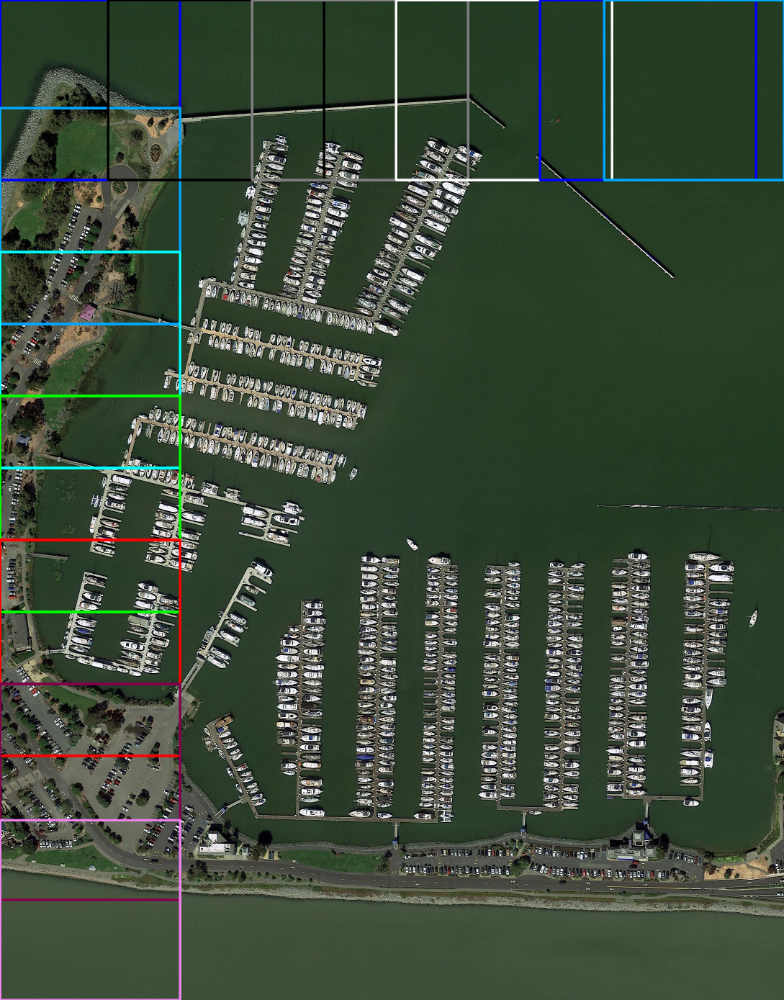

/content/drive/MyDrive/DOTA/Dataset/Train/images/P0861.png


In [ ]:
crop_images_display(X_train, threshold=5)

In [ ]:
class_name_to_id_mapping = {
    'BG': -1,
    'plane': 0,
    'ship': 1,
    'storage-tank': 2,
    'baseball-diamond': 3,
    'tennis-court': 4,
    'basketball-court': 5,
    'ground-track-field': 6,
    'harbor': 7,
    'bridge': 8,
    'large-vehicle': 9,
    'small-vehicle': 10,
    'helicopter': 11,
    'roundabout': 12,
    'soccer-ball-field': 13,
    'swimming-pool': 14,
    'container-crane': 15
}

In [ ]:
def read_annots(annot):
  annots = open(annot, 'r').readlines()[2:]
  annots = [line.replace('\n', '').split(' ') for line in annots]
  annots_re = []
  for line in annots:
    xs = [int(float(line[0])), int(float(line[2])), int(float(line[4])), int(float(line[6]))]
    ys = [int(float(line[1])), int(float(line[3])), int(float(line[5])), int(float(line[7]))]
    annots_re.append([min(xs), min(ys), max(xs), max(ys), class_name_to_id_mapping[line[8]], 0, 0])
  return np.array(annots_re)

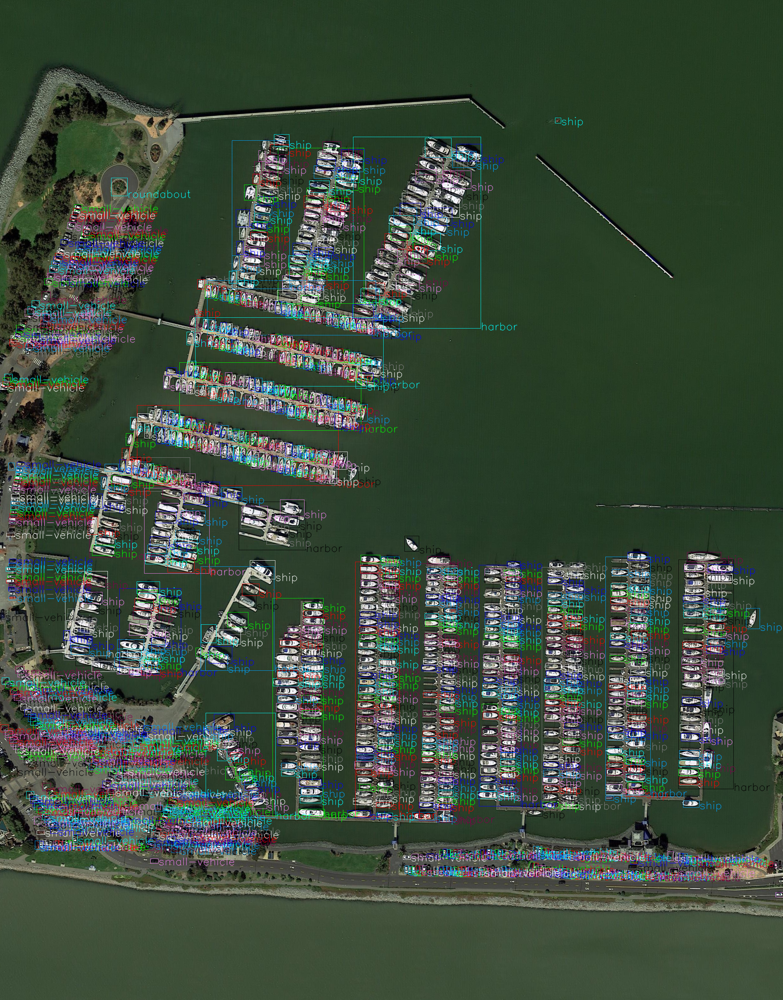

In [ ]:
img = '/content/drive/MyDrive/DOTA/Dataset/Train/images/P0861.png'
image = cv.imread(img)
all_annots = read_annots(img.replace('images', 'annots').replace('png', 'txt'))
i = 0

for annot_box in all_annots:
  cv.rectangle(image,
              (annot_box[0], annot_box[1]), 
              (annot_box[2], annot_box[3]), 
              (0, 255, 0), 
              1) 
  cv.putText(image, 
              f"{annot_box[4]}", 
              (annot_box[2], annot_box[3] + 5), 
              cv.FONT_HERSHEY_SIMPLEX,
              0.3, 
              all_colors[i],
              1, 
              cv.LINE_AA)
  i += 1
  if i == len(all_colors):
    i = 0
cv2_imshow(image)

In [ ]:
# stworzenie list X - dane (obrazy) y - adnotacje
def create_dataset_mod(all_images_folder, all_annots_folder, folder_number):
  X = []
  y = []
  all_images = glob.glob(all_images_folder + f'{folder_number}/*.png')
  all_annots = glob.glob(all_annots_folder + f'{folder_number}/*.txt')
  print(len(all_images))
  print(len(all_annots))

  for annot in all_annots:
    annot_file_name = os.path.basename(annot).replace('.txt', '')
    for image in all_images:
      image_file_name = os.path.basename(image).replace('.png', '')
      if annot_file_name == image_file_name:
        X.append(image)
        y.append(annot)
        break
  return X, y

In [ ]:
folder_with_data_mod = '/content/drive/MyDrive/DOTA/Dataset'

train_mod_images_dir = folder_with_data_mod + '/Train/mod/images'
train_mod_annotations_dir = folder_with_data_mod + '/Train/mod/annots'

In [ ]:
X_train_mod = []
y_train_mod = []

for i in range(10):
  X_train_mod_temp, y_train_mod_temp = create_dataset_mod(train_mod_images_dir, train_mod_annotations_dir, folder_number=i)
  X_train_mod += X_train_mod_temp
  y_train_mod += y_train_mod_temp

2461
2461
2445
2445
2385
2385
2459
2459
2438
2438
2479
2479
2430
2430
2410
2410
2437
2437
2503
2503


In [ ]:
X_val_mod = []
y_val_mod = []

for i in range(10, 14):
  X_val_mod_temp, y_val_mod_temp = create_dataset_mod(train_mod_images_dir, train_mod_annotations_dir, folder_number=i)
  X_val_mod += X_val_mod_temp
  y_val_mod += y_val_mod_temp

2386
2386
2459
2459
2337
2337
2417
2417


In [ ]:
test_mod_images_dir = folder_with_data_mod + '/Val/mod/images'
test_mod_annotations_dir = folder_with_data_mod + '/Val/mod/annots'

In [ ]:
X_test_mod = []
y_test_mod = []

for i in range(6):
  X_test_mod_temp, y_test_mod_temp = create_dataset_mod(test_mod_images_dir, test_mod_annotations_dir, folder_number=i)
  X_test_mod += X_test_mod_temp
  y_test_mod += y_test_mod_temp

1788
1788
1800
1800
1822
1822
1748
1748
1858
1858
1800
1800


In [ ]:
amount_of_instances_on_imgs_train, amount_of_classes_train = return_number_of_instances(y_train_mod)

show_log_histogram_dictionary(list(amount_of_classes_train.keys()), 
                   amount_of_classes_train.values(), 
                   'Klasa', 
                   'ilość obiektów danej klasy w zbiorze treningowym', 
                   (30,5))

show_histogram(amount_of_instances_on_imgs_train, 
               'ilość obiektów na obrazie', 
               'ilość', 
               'ilość obiektów na obrazie w zbiorze treningowym, przetworzonym', 
               log=True)

In [ ]:
amount_of_instances_on_imgs_val, amount_of_classes_val = return_number_of_instances(y_val_mod)

show_log_histogram_dictionary(list(amount_of_classes_val.keys()), 
                   amount_of_classes_val.values(), 
                   'Klasa', 
                   'ilość obiektów danej klasy w zbiorze walidacyjnym, przetworzonym', 
                   (30,5))

show_histogram(amount_of_instances_on_imgs_train, 
               'ilość obiektów na obrazie', 
               'ilość', 
               'ilość obiektów na obrazie w zbiorze walidacyjnym, przetworzonym', 
               log=True)

In [ ]:
heights_val_mod, widths_val_mod = return_h_w(X_val_mod)

show_histogram(heights_val_mod, 'wysokość', '', 'histogram - wysokość obrazów w zbiorze walidacyjnym, przetworzonym')
show_histogram(widths_val_mod, 'szerokość', '', 'histogram - szerokość obrazów w zbiorze walidacyjnym, przetworzonym')